### TODO FOR BOI AG

- Patches
    - Numpy array med patches 
        - Param > False image / true patches
        - Param > training or testing
        - Returns x_train, y_train, x_test, y_test
    - Rotation
  
- Patches to image
    - PARAMS lista med patches
- Keras generator




In [4]:
%matplotlib inline
import matplotlib.image as mpimg
import numpy as np
import matplotlib.pyplot as plt
import os,sys
from PIL import Image
import pandas as pd
import numpy

In [5]:
# Helper functions

def load_image(infilename):
    data = mpimg.imread(infilename)
    return data

def img_crop(im, w, h):
    list_patches = []
    imgwidth = im.shape[0]
    imgheight = im.shape[1]
    is_2d = len(im.shape) < 3
    for i in range(0,imgheight,h):
        for j in range(0,imgwidth,w):
            if is_2d:
                im_patch = im[j:j+w, i:i+h]
            else:
                im_patch = im[j:j+w, i:i+h, :]
            list_patches.append(im_patch)
    return list_patches

def extract_data(filename, num_images):
    """Extract the images into a 4D tensor [image index, y, x, channels].
    Values are rescaled from [0, 255] down to [-0.5, 0.5].
    """
    imgs = []
    for i in range(1, num_images+1):
        imageid = "satImage_%.3d" % i
        image_filename = filename + imageid + ".png"
        if os.path.isfile(image_filename):
            #print('Loading ' + image_filename)
            img = mpimg.imread(image_filename)
            imgs.append(img)
        else:
            print('File ' + image_filename + ' does not exist')

    num_images = len(imgs)
    IMG_WIDTH = imgs[0].shape[0]
    IMG_HEIGHT = imgs[0].shape[1]
    N_PATCHES_PER_IMAGE = (IMG_WIDTH/IMG_PATCH_SIZE)*(IMG_HEIGHT/IMG_PATCH_SIZE)

    img_patches = [img_crop(imgs[i], IMG_PATCH_SIZE, IMG_PATCH_SIZE) for i in range(num_images)]
    data = [img_patches[i][j] for i in range(len(img_patches)) for j in range(len(img_patches[i]))]

    return numpy.asarray(data)

In [6]:
IMG_PATCH_SIZE = 16
img1 = load_image('data/training/images/satImage_002.png')
data = extract_data('data/training/images/', 100)
img = img_crop(img1, IMG_PATCH_SIZE, IMG_PATCH_SIZE)

img = np.asarray(img)

#plt.imshow(img)
#plt.show()

rgb = []
red = []
gre = []
blu = []
for i in range(data.shape[0]):
    arr = data[i].flatten()
    red.append(arr[2::3])
    gre.append(arr[1::3])
    blu.append(arr[0::3])
    
rgb = [red,gre,blu]
data.shape

(62500, 16, 16, 3)

In [7]:
np.asarray(rgb).shape

(3, 62500, 256)

"b = pca_imgs.copy()\n# set green and red channels to 0\nb[:, :, :, 1] = 0\nb[:, :, :, 2] = 0\n\ng = pca_imgs.copy()\n# set blue and red channels to 0\ng[:, :, :, 0] = 0\ng[:, :, :, 2] = 0\n\nr = pca_imgs.copy()\n# set blue and green channels to 0\nr[:, :, :, 0] = 0\nr[:, :, :,  1] = 0\n\ncolors = [b,g,r]\n\nfor color in colors:\n    fig, axes = plt.subplots(1,N_COMPONENTS,figsize=(15,5),\n                     subplot_kw={'xticks':[], 'yticks':[]},\n                     gridspec_kw=dict(hspace=0.01, wspace=0.01))\n\n    for i, ax in enumerate(axes.flat):\n        ax.imshow(color[i])"

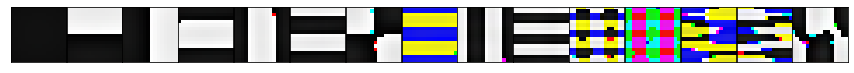

In [10]:
from sklearn.decomposition import PCA
N_COMPONENTS = IMG_PATCH_SIZE * IMG_PATCH_SIZE
pca = PCA(n_components=N_COMPONENTS)
pca_imgs = np.zeros((N_COMPONENTS,IMG_PATCH_SIZE,IMG_PATCH_SIZE,3))

for i in range(3):
    principalComponents = pca.fit_transform(rgb[i])
    for n in range(N_COMPONENTS):
        components = pca.components_[n].reshape(IMG_PATCH_SIZE,IMG_PATCH_SIZE)
        
        
        for row in range(IMG_PATCH_SIZE):
            for col in range(IMG_PATCH_SIZE):
                pca_imgs[n][row][col][i] = components[row][col]
                
pca_imgs = (pca_imgs * 255).astype(np.uint8)
fig, axes = plt.subplots(1,15,figsize=(15,5),
                     subplot_kw={'xticks':[], 'yticks':[]},
                     gridspec_kw=dict(hspace=0.01, wspace=0.01))

for i, ax in enumerate(axes.flat):
    ax.imshow(pca_imgs[i])
    if(i > 15):
        break
    




"""b = pca_imgs.copy()
# set green and red channels to 0
b[:, :, :, 1] = 0
b[:, :, :, 2] = 0

g = pca_imgs.copy()
# set blue and red channels to 0
g[:, :, :, 0] = 0
g[:, :, :, 2] = 0

r = pca_imgs.copy()
# set blue and green channels to 0
r[:, :, :, 0] = 0
r[:, :, :,  1] = 0

colors = [b,g,r]

for color in colors:
    fig, axes = plt.subplots(1,N_COMPONENTS,figsize=(15,5),
                     subplot_kw={'xticks':[], 'yticks':[]},
                     gridspec_kw=dict(hspace=0.01, wspace=0.01))

    for i, ax in enumerate(axes.flat):
        ax.imshow(color[i])"""




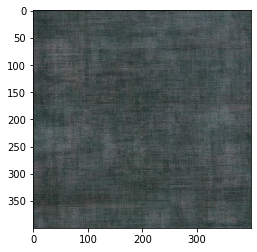

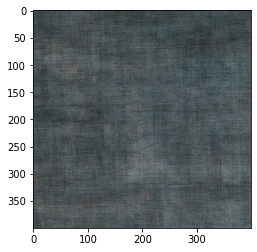

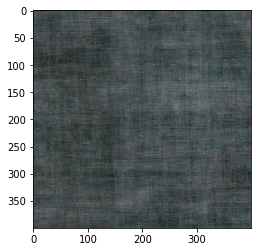

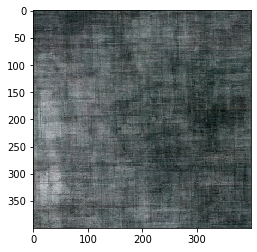

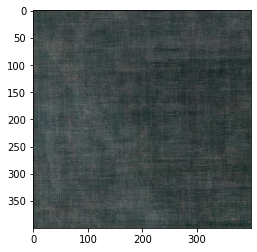

...

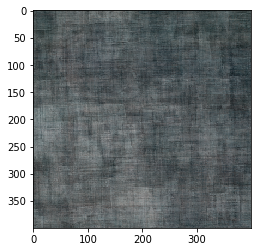

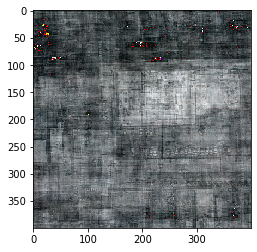

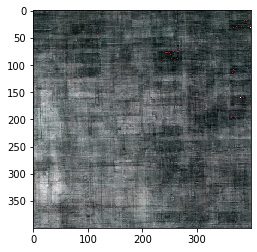

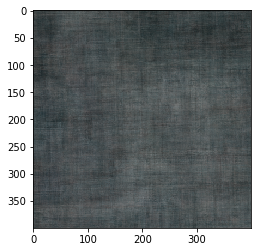

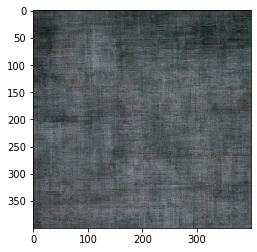

In [145]:
rgb_transform=[]
for i in range(3):
    components = pca.transform(rgb[i])
    projected = pca.inverse_transform(components)
    rgb_transform.append(projected.reshape(100,400,400))
pics = np.zeros((100,400,400,3))
for color_num in range(3):
    for img_num in range(100):
        for x in range(400):
            for y in range(400):
                pics[img_num][x][y][color_num] = rgb_transform[color_num][img_num][x][y]
                
pics = (pics * 255).astype(np.uint8)
for i in range(100):
    plt.imshow(pics[i])
    plt.show()